# 🤗 Training with Diffusers
В последнее время стало ясно, что диффузионные модели  смещают генеративно-состязательные с трона, поэтому сегодня мы будем использовать библиотеку [Diffusers](https://github.com/huggingface/diffusers) от Hugging Face чтобы обучить простейшую диффузионную модель. 

<!-- 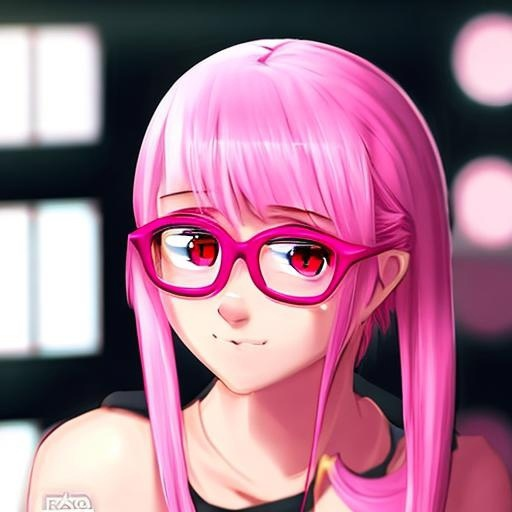 -->

## Боремся с зависимостями

Этот блокнот использует библиотеку [🤗 Datasets](https://huggingface.co/docs/datasets/index) чтобы загрузить и предобработать данные и библиотеку [🤗 Accelerate](https://huggingface.co/docs/accelerate/index) для быстрого и простого обучения.

In [34]:
%%capture
!pip install diffusers[training]==0.11.1

## Конфигурируем

Для удобства все гиперпараметры собираем в одном месте

In [35]:
from dataclasses import dataclass

@dataclass
class TrainingConfig:
    image_size = 128  # the generated image resolution
    train_batch_size = 16
    eval_batch_size = 16
    # how many images to sample during evaluation
    num_epochs = 20
    gradient_accumulation_steps = 1
    learning_rate = 1e-4
    lr_warmup_steps = 500
    save_image_epochs = 5
    save_model_epochs = 20
    mixed_precision = 'fp16'  # `no` for float32, `fp16` for automatic mixed precision
    output_dir = 'anime-face'  # the model namy locally and on the HF Hub

    push_to_hub = False  # whether to upload the saved model to the HF Hub
    hub_private_repo = False  
    overwrite_output_dir = True  # overwrite the old model when re-running the notebook
    seed = 0

config = TrainingConfig()

## Загружаем

В нашем случае [датасет](https://huggingface.co/datasets/DrishtiSharma/Anime-Face-Dataset) находится на HuggingFace.co, но можно использовать свой датасет, сохраненный локально как [ImageFolder](https://huggingface.co/docs/datasets/v2.0.0/en/image_process#imagefolder).

In [36]:
from datasets import load_dataset

config.dataset_name = "DrishtiSharma/Anime-Face-Dataset"
dataset = load_dataset(config.dataset_name, split="train[:20%]")

# config.dataset_name = "imagefolder"
# dataset = load_dataset(config.dataset_name, data_dir="path/to/folder")

In [37]:
dataset

Dataset({
    features: ['image'],
    num_rows: 12713
})

Так как фича [`Image`](https://huggingface.co/docs/datasets/image_process#image-datasets) это объект картинка PIL, то мы можем легко взглянуть на наших тяночек

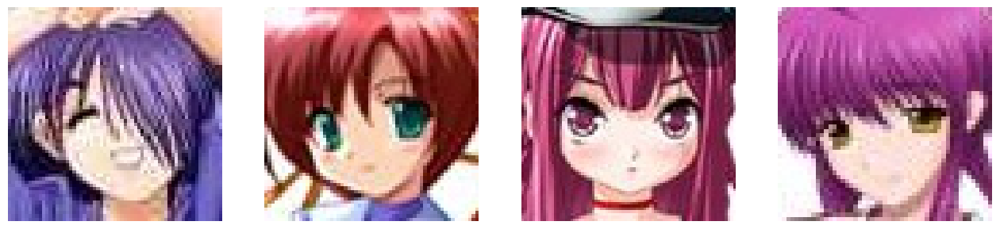

In [38]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for i, image in enumerate(dataset[:4]["image"]):
    axs[i].imshow(image)
    axs[i].set_axis_off()
fig.show()

Все изображения в датасете разные и их надо предобработать:
* `Resize` масштабирует изображения до квадратного с размером `config.image_size`
* `RandomHorizontalFlip` дополняет набор данных путем случайного зеркального отображения изображений.
* `Normalize` сжимает масштаб значений пикселей в `[-1, 1]`.

In [39]:
from torchvision import transforms
# https://pytorch.org/vision/stable/transforms.html
preprocess = transforms.Compose(
    [
        transforms.Resize((config.image_size, config.image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ]
)

In [40]:
def transform(examples):
    images = [preprocess(image.convert("RGB")) for image in examples["image"]]
    return {"images": images}

dataset.set_transform(transform)

Посмотрим что получилось

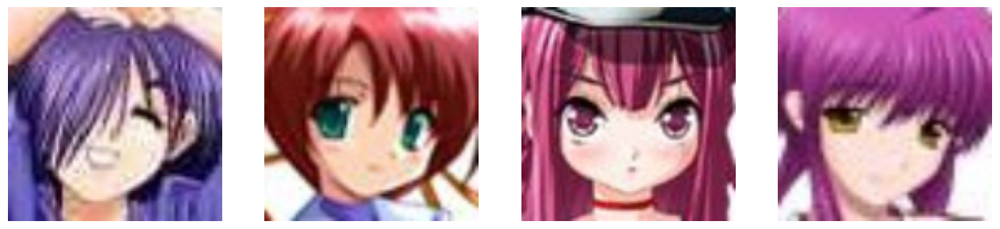

In [41]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for i, image in enumerate(dataset[:4]["images"]):
    axs[i].imshow(image.permute(1, 2, 0).numpy() / 2 + 0.5)
    axs[i].set_axis_off()
fig.show()

Когда наши вайфу одного размера и превращены в тензоры, мы можем создать загрузчик данных.

In [42]:
import torch

train_dataloader = torch.utils.data.DataLoader(dataset, batch_size=config.train_batch_size, shuffle=True)

## Настраиваем

Здесь мы настраиваем нашу диффузионную модель. Диффузионные модели — это нейронные сети, обученные предсказывать чуть менее шумные изображения на основе входного шума. На инференсе их можно использовать для итеративного преобразования случайного шума в изображения:

<p align="center">
    <img src="https://user-images.githubusercontent.com/10695622/174349667-04e9e485-793b-429a-affe-096e8199ad5b.png" width="800"/>
    <br>
    <em>DDPM paper (https://arxiv.org/abs/2006.11239). </em>
<p>

Не беспокойтесь, если не понимаете матешу. Важно понять, что наша модель соответствует стрелке $p_{\theta}(x_{t-1}|x_{t}) $ (что является заумным способом сказать: `предсказать немного менее шумное изображение`).

Круто то, что к изображению очень легко добавить немного шума, поэтому обучение может происходить с частичным привлечением учителя следующим образом:
1. Возьмите изображение из тренировочного набора.
2. Примените к нему случайный шум $t$ раз (это даст $x_{t-1}$ и $x_{t}$ на рисунке выше).
3. Дайте модели это зашумленное изображение вместе со значением $t$.
4. Вычислите функцию потерь

Затем мы можем применить градиентный спуск для уменьшения лосса и повторить этот процесс несколько раз.

## Функция потерь? Градиентный спуск? Шта?

* По сути просто разница между тем, что должно быть, и тем что посчитали
* https://distill.pub/2017/momentum/

## О батчах замолвим слово
<!-- 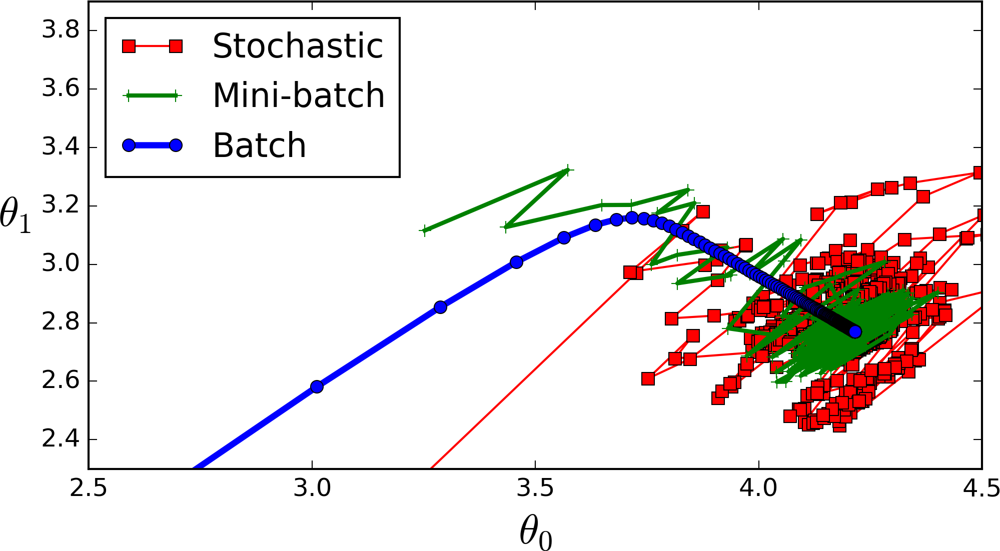 -->

### Большинство диффузионных моделей реализуют [U-net](https://arxiv.org/abs/1505.04597). Не будет от этого отходить.

![](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/unet-model.png)

В двух словах:
- модель пропускать входное изображение через несколько ResNet слоев, которые уменьшают размер изображения в два раза.
- потом через то же количество слоев, которые увеличивают изображение в два раза
- есть skip-connections, связывающие слои на "понижающей" пути с соответствующими слоями на "повышающем" пути (снижают симметрию параметрического пространства, уменьшая, тем самым, число локальных минимумов и облегчая сходимость)

Ключевой особенностью этой модели является то, что она предсказывает изображения того же размера, что и входные данные, что нам здесь и нужно.

Diffusers предоставляет класс `UNet2DModel` для быстрого создания модели на  PyTorch.


In [43]:
from diffusers import UNet2DModel


model = UNet2DModel(
    sample_size=config.image_size,  # the target image resolution
    in_channels=3,  # the number of input channels, 3 for RGB images
    out_channels=3,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(128, 128, 256, 256, 512, 512),  # the number of output channes for each UNet block
    down_block_types=( 
        "DownBlock2D",  # a regular ResNet downsampling block
        "DownBlock2D", 
        "DownBlock2D", 
        "DownBlock2D", 
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "DownBlock2D",
    ), 
    up_block_types=(
        "UpBlock2D",  # a regular ResNet upsampling block
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D", 
        "UpBlock2D", 
        "UpBlock2D", 
        "UpBlock2D"  
      ),
)

Возьмем тяночку и пропустим ее через модель:

In [44]:
sample_image = dataset[0]['images'].unsqueeze(0)
print('Input shape:', sample_image.shape)

Input shape: torch.Size([1, 3, 128, 128])


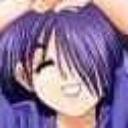

In [45]:
from PIL import Image

Image.fromarray(((sample_image.permute(0, 2, 3, 1) + 1.0) * 127.5).type(torch.uint8).numpy()[0])

И проверим, что выходная тяночка таких же размеров:

In [46]:
print('Output shape:', model(sample_image, timestep=0).sample.shape)

Output shape: torch.Size([1, 3, 128, 128])


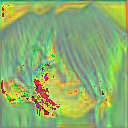

In [47]:
Image.fromarray(((model(sample_image, timestep=0).sample.permute(0, 2, 3, 1) + 1.0) * 127.5).type(torch.uint8).numpy()[0])

Отлично!

Заметим, что модель принимает на вход зашумленное изображение и $t$.

Эта информация о временном шаге преобразуется для модели в эмбеддинг с помощью позиционного кодирования, аналогичного тому, что часто делают модели Transformer.

Когда мы уже имеем нашу модель, нам всего лишь нужно *добавить шума картинке*. Это делается **schedulers** из библиотеки `diffusers`.

## Шумим
В зависимости от конкретной диффузии, которую вы хотите использовать, шуметь на картинки можно по разному.
Мы будем использовать `DDPMScheduler` ([Denoising Diffusion Probabilistic Models](https://arxiv.org/abs/2006.11239)).

In [48]:
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

Давайте посмотрим, как работает `noise scheduler`: он берет батч изображений из обучающей выборки (здесь мы опять используем батч из одного изображения `sample_image` выше), батч случайного шума той же формы и временные шаги для каждого изображения. (которые соответствуют тому, сколько раз мы хотим применить шум к каждому изображению):

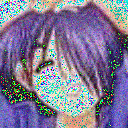

In [49]:
import torch

noise = torch.randn(sample_image.shape)
timesteps = torch.LongTensor([50])
noisy_image = noise_scheduler.add_noise(sample_image, noise, timesteps)

Image.fromarray(((noisy_image.permute(0, 2, 3, 1) + 1.0) * 127.5).type(torch.uint8).numpy()[0])

В алгоритме DDPM цель обучения модели состоит в том, чтобы иметь возможность предсказыватть шум, который мы использовали в `noise_scheduler.add_noise`, поэтому лосс на этом этапе будет:

In [50]:
import torch.nn.functional as F

noise_pred = model(noisy_image, timesteps).sample
loss = F.mse_loss(noise_pred, noise)

## Тренируемся
Мы собрали все, что нужно для обучения! Осталось взять стандартный оптимизатор AdamW:

In [51]:
optimizer = torch.optim.AdamW(model.parameters(), lr=config.learning_rate)

 И cosine learning rate schedule, потому что график прикольный:
<!--  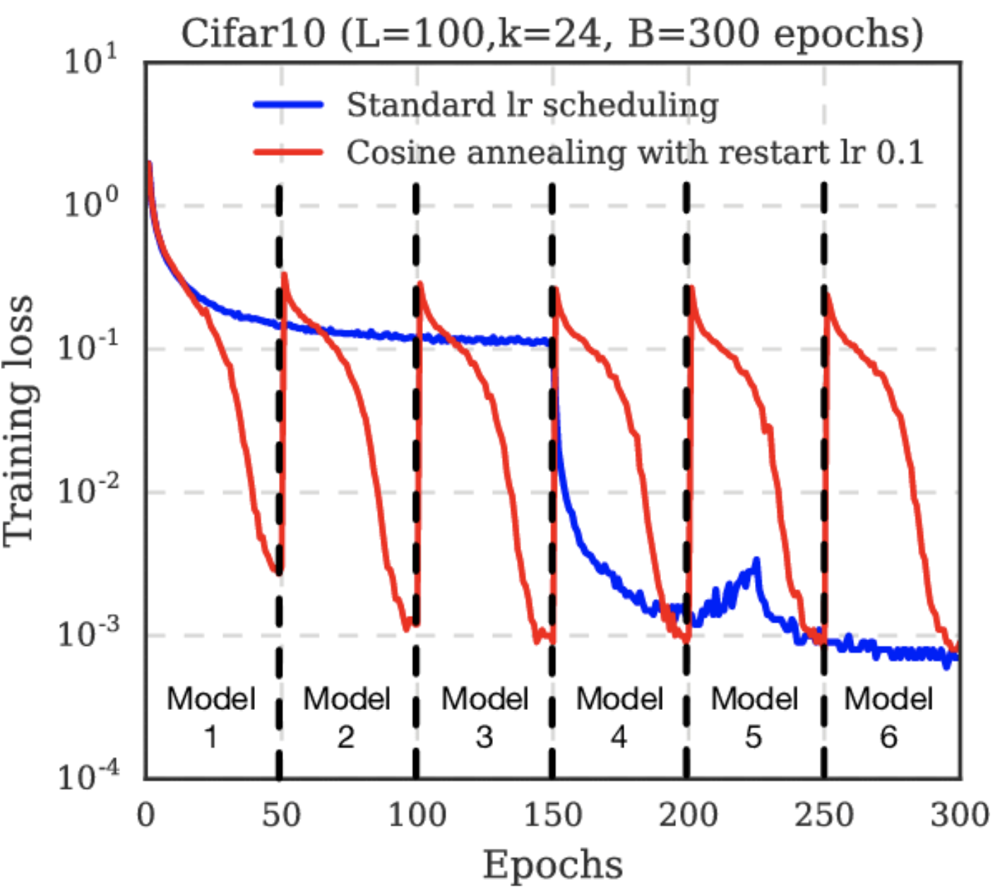 -->

In [52]:
from diffusers.optimization import get_cosine_schedule_with_warmup

lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=config.lr_warmup_steps,
    num_training_steps=(len(train_dataloader) * config.num_epochs),
)

Чтобы запустить нашу модель, мы используем `DDPMPipeline`. Мы будем использовать этот пайплайн для создания батча образцов изображений и сохранения их в виде сетки на диск.

In [53]:
from diffusers import DDPMPipeline

import math

def make_grid(images, rows, cols):
    w, h = images[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, image in enumerate(images):
        grid.paste(image, box=(i%cols*w, i//cols*h))
    return grid

def evaluate(config, epoch, pipeline):
    # Sample some images from random noise (this is the backward diffusion process).
    # The default pipeline output type is `List[PIL.Image]`
    images = pipeline(
        batch_size = config.eval_batch_size, 
        generator=torch.manual_seed(config.seed),
    ).images

    # Make a grid out of the images
    image_grid = make_grid(images, rows=4, cols=4)

    # Save the images
    test_dir = os.path.join(config.output_dir, "samples")
    os.makedirs(test_dir, exist_ok=True)
    image_grid.save(f"{test_dir}/{epoch:04d}.png")

И наконец мы можем собрать все и написать функцию для обучения модели:

In [54]:
from accelerate import Accelerator
from huggingface_hub import HfFolder, Repository, whoami

from tqdm.auto import tqdm
from pathlib import Path
import os


def train_loop(config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler):
    # Initialize accelerator and tensorboard logging
    accelerator = Accelerator(
        mixed_precision=config.mixed_precision,
        gradient_accumulation_steps=config.gradient_accumulation_steps, 
        log_with="tensorboard",
        logging_dir=os.path.join(config.output_dir, "logs")
    )
    if accelerator.is_main_process:
        if config.output_dir is not None:
            os.makedirs(config.output_dir, exist_ok=True)
        accelerator.init_trackers("train_example")
    
    # Prepare everything
    # There is no specific order to remember, you just need to unpack the 
    # objects in the same order you gave them to the prepare method.
    model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
        model, optimizer, train_dataloader, lr_scheduler
    )
    
    global_step = 0

    # Now you train the model
    for epoch in range(config.num_epochs):
        progress_bar = tqdm(total=len(train_dataloader), disable=not accelerator.is_local_main_process)
        progress_bar.set_description(f"Epoch {epoch}")

        for step, batch in enumerate(train_dataloader):
            clean_images = batch['images']
            # Sample noise to add to the images
            noise = torch.randn(clean_images.shape).to(clean_images.device)
            bs = clean_images.shape[0]

            # Sample a random timestep for each image
            timesteps = torch.randint(0, noise_scheduler.num_train_timesteps, (bs,), device=clean_images.device).long()

            # Add noise to the clean images according to the noise magnitude at each timestep
            # (this is the forward diffusion process)
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)
            
            with accelerator.accumulate(model):
                # Predict the noise residual
                noise_pred = model(noisy_images, timesteps, return_dict=False)[0]
                loss = F.mse_loss(noise_pred, noise)
                accelerator.backward(loss)

                accelerator.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()
            
            progress_bar.update(1)
            logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
            progress_bar.set_postfix(**logs)
            accelerator.log(logs, step=global_step)
            global_step += 1

        # After each epoch you optionally sample some demo images with evaluate() and save the model
        if accelerator.is_main_process:
            pipeline = DDPMPipeline(unet=accelerator.unwrap_model(model), scheduler=noise_scheduler)

            if (epoch + 1) % config.save_image_epochs == 0 or epoch == config.num_epochs - 1:
                evaluate(config, epoch, pipeline)

            if (epoch + 1) % config.save_model_epochs == 0 or epoch == config.num_epochs - 1:
                if config.push_to_hub:
                    repo.push_to_hub(commit_message=f"Epoch {epoch}", blocking=True)
                else:
                    pipeline.save_pretrained(config.output_dir) 

## Let's train!

И наконец-то запустим обучение (вообще нет)

In [ ]:
from accelerate import notebook_launcher
args = (config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler)

notebook_launcher(train_loop, args, num_processes=1)

Launching training on one GPU.


  0%|          | 0/795 [00:00<?, ?it/s]

Взглянем на нейротяночек

In [ ]:
import glob

sample_images = sorted(glob.glob(f"{config.output_dir}/samples/*.png"))
Image.open(sample_images[-1])